## Minimal Experiment
In this notebook I attempt to run the first batch of minimal experiments: run multiple market sessions with homogeneous populations of PRDE traders with different k-values and analyse if it results in any differneces in average profit.

Helper functions from lab 8

In [43]:
import matplotlib.pyplot as plt
import numpy as np
import csv
import math
import random

import scipy as sp
from scipy import stats
import seaborn as sns 
import matplotlib.pyplot as plt 
import statsmodels.api as sm
import pandas as pd

from BSE import market_session
import helpers

Setup of a static, homogeneous session with 20 PRDE buyers and sellers and a k to be set

In [32]:
def static_homogeneous_session(k, F, trial_id_str, csv_str):
    # First, configure the trader specifications
    sellers_spec = [('PRDE', 20, {'k': k, 's_min': -1.0, 's_max': +1.0, 'diffevol["F"]':F})]
    buyers_spec = sellers_spec
    traders_spec = {'sellers':sellers_spec, 'buyers':buyers_spec}

    # Next, confiure the supply and demand (and plot it)
    sup_range = (100, 200)
    dem_range = sup_range

    # Next, configure order schedules

    start_time = 0
    end_time = 60 * 3
    supply_schedule = [{'from': start_time, 'to': end_time, 'ranges': [sup_range], 'stepmode': 'fixed'}]
    demand_schedule = [{'from': start_time, 'to': end_time, 'ranges': [dem_range], 'stepmode': 'fixed'}]

    order_interval = 10
    order_sched = {'sup': supply_schedule, 'dem': demand_schedule,
               'interval': order_interval, 'timemode': 'periodic'}

    trial_id = trial_id_str
    tdump = open(csv_str,'w')
    dump_all = True
    verbose = False

    # Now, run the market session
    market_session(trial_id, start_time, end_time, traders_spec, order_sched, tdump, dump_all, verbose)

    tdump.close()

A function that runs n-4 market sessions, each with a different k, produces a plot of the average profits and returns the k that yielded the highest average profits.

B00: PRDE active_strat=[0]:
[0]: s=-0.594122, start=0.000000, $=0.000000, pps=0.000000
[1]: s=-0.281842, start=0.000000, $=0.000000, pps=0.000000
[2]: s=-0.650624, start=0.000000, $=0.000000, pps=0.000000
[3]: s=-0.981057, start=0.000000, $=0.000000, pps=0.000000


B01: PRDE active_strat=[0]:
[0]: s=-0.823278, start=0.000000, $=0.000000, pps=0.000000
[1]: s=+0.089306, start=0.000000, $=0.000000, pps=0.000000
[2]: s=+0.276001, start=0.000000, $=0.000000, pps=0.000000
[3]: s=-0.179136, start=0.000000, $=0.000000, pps=0.000000


B02: PRDE active_strat=[0]:
[0]: s=+0.329636, start=0.000000, $=0.000000, pps=0.000000
[1]: s=-0.633370, start=0.000000, $=0.000000, pps=0.000000
[2]: s=-0.476834, start=0.000000, $=0.000000, pps=0.000000
[3]: s=+0.313548, start=0.000000, $=0.000000, pps=0.000000


B03: PRDE active_strat=[0]:
[0]: s=-0.683274, start=0.000000, $=0.000000, pps=0.000000
[1]: s=+0.296321, start=0.000000, $=0.000000, pps=0.000000
[2]: s=+0.471247, start=0.000000, $=0.000000, pps=0.0000

4

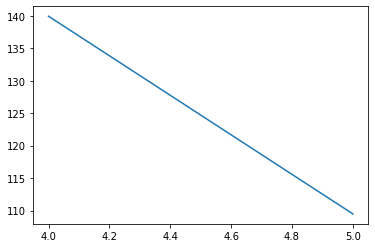

In [35]:
def avg_profit(n, trial_id_str, csv_str, out_csv_str):
    i = 4
    profits = []
    while i < n:
        static_homogeneous_session(i, 0.8, trial_id_str, csv_str)
        df = pd.read_csv(csv_str)
        profits.append(df.iloc[:,7].max())
        i = i+1

    print(profits)
    profits_df = pd.DataFrame([[i] for i in profits])
    profits_df.to_csv(out_csv_str)
    plt.plot(np.arange(4, n, 1), profits)
    return np.argmax(np.array(profits))+4

Run the function j times to see how consistent the results are

B00: PRDE active_strat=[0]:
[0]: s=-0.816830, start=0.000000, $=0.000000, pps=0.000000
[1]: s=-0.277885, start=0.000000, $=0.000000, pps=0.000000
[2]: s=-0.661833, start=0.000000, $=0.000000, pps=0.000000
[3]: s=+0.617924, start=0.000000, $=0.000000, pps=0.000000


B01: PRDE active_strat=[0]:
[0]: s=+0.213603, start=0.000000, $=0.000000, pps=0.000000
[1]: s=+0.162408, start=0.000000, $=0.000000, pps=0.000000
[2]: s=-0.683234, start=0.000000, $=0.000000, pps=0.000000
[3]: s=-0.138661, start=0.000000, $=0.000000, pps=0.000000


B02: PRDE active_strat=[0]:
[0]: s=+0.898791, start=0.000000, $=0.000000, pps=0.000000
[1]: s=+0.088354, start=0.000000, $=0.000000, pps=0.000000
[2]: s=-0.110292, start=0.000000, $=0.000000, pps=0.000000
[3]: s=-0.463519, start=0.000000, $=0.000000, pps=0.000000


B03: PRDE active_strat=[0]:
[0]: s=+0.863693, start=0.000000, $=0.000000, pps=0.000000
[1]: s=+0.815500, start=0.000000, $=0.000000, pps=0.000000
[2]: s=-0.152778, start=0.000000, $=0.000000, pps=0.0000

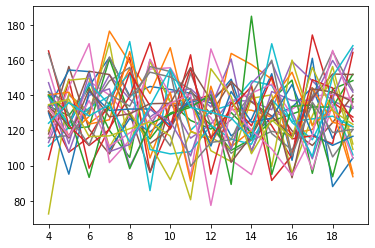

In [37]:
random.seed(2)

j = 0
best_ks = []
while j < 30:
    best_ks.append(avg_profit(20, 'test_4', 'test_4_avg_balance.csv', 'profit_2.csv'))
    j = j+1

print(best_ks)

They vary quite a bit, there doesn't seem to be a trend. the market sessions have some degree of randomness in them, FIGURE OUT WHERE IT COMES FROM. It may also be that 
+ the measure of average profit is not appropriate as I'm not extracting the limit prices I believe, or 
+ I haven't ran enough repetitions to extract any meaningful insights
+ I haven't investigated it hard enough 

median: 9.5
mean: 10.966666666666667


(array([3., 2., 8., 2., 3., 0., 2., 1., 6., 3.]),
 array([ 4. ,  5.5,  7. ,  8.5, 10. , 11.5, 13. , 14.5, 16. , 17.5, 19. ]),
 <BarContainer object of 10 artists>)

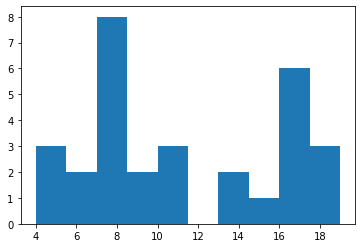

In [38]:
print('median: ' + str(np.median(np.array(best_ks))))
print('mean: ' + str(np.mean(np.array(best_ks))))
plt.hist(np.array(best_ks))

Running multiple times with the same k to see if I get any different results:

In [39]:
random.seed(2)


trial_id_str = 'test_5'
csv_str = 'test_5_avg_balance.csv'
out_csv_str = '4k_profits.csv'
j = 0
profits = []
while j < 30:
    static_homogeneous_session(4, 0.8, trial_id_str, csv_str)
    df = pd.read_csv(csv_str)
    profits.append(df.iloc[:,7].max())
    j = j+1

B00: PRDE active_strat=[0]:
[0]: s=-0.816830, start=0.000000, $=0.000000, pps=0.000000
[1]: s=-0.277885, start=0.000000, $=0.000000, pps=0.000000
[2]: s=-0.661833, start=0.000000, $=0.000000, pps=0.000000
[3]: s=+0.617924, start=0.000000, $=0.000000, pps=0.000000


B01: PRDE active_strat=[0]:
[0]: s=+0.213603, start=0.000000, $=0.000000, pps=0.000000
[1]: s=+0.162408, start=0.000000, $=0.000000, pps=0.000000
[2]: s=-0.683234, start=0.000000, $=0.000000, pps=0.000000
[3]: s=-0.138661, start=0.000000, $=0.000000, pps=0.000000


B02: PRDE active_strat=[0]:
[0]: s=+0.898791, start=0.000000, $=0.000000, pps=0.000000
[1]: s=+0.088354, start=0.000000, $=0.000000, pps=0.000000
[2]: s=-0.110292, start=0.000000, $=0.000000, pps=0.000000
[3]: s=-0.463519, start=0.000000, $=0.000000, pps=0.000000


B03: PRDE active_strat=[0]:
[0]: s=+0.863693, start=0.000000, $=0.000000, pps=0.000000
[1]: s=+0.815500, start=0.000000, $=0.000000, pps=0.000000
[2]: s=-0.152778, start=0.000000, $=0.000000, pps=0.0000

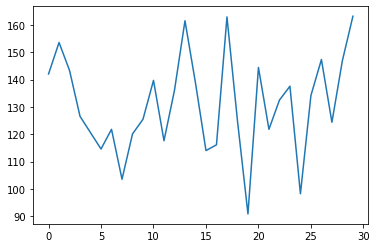

In [41]:
profits_df = pd.DataFrame([[i] for i in profits])
profits_df.to_csv(out_csv_str)
plt.plot(np.arange(0, 30, 1), profits)